In [2]:
import rasterio
import numpy
import matplotlib.pyplot as plt
import os
import pandas as pd

from rasterio.plot import show

In [7]:
os.chdir('D:\Geospatial\Sentinel')

In [10]:
band_red = rasterio.open('D:/Geospatial/Sentinel/S2A_MSIL1C_20181011T023621_N0206_R089_T49MDM_20181011T061048.SAFE/GRANULE/L1C_T49MDM_A017246_20181011T025856/IMG_DATA/T49MDM_20181011T023621_B04.jp2')
band_nir = rasterio.open('D:/Geospatial/Sentinel/S2A_MSIL1C_20181011T023621_N0206_R089_T49MDM_20181011T061048.SAFE/GRANULE/L1C_T49MDM_A017246_20181011T025856/IMG_DATA/T49MDM_20181011T023621_B08.jp2')

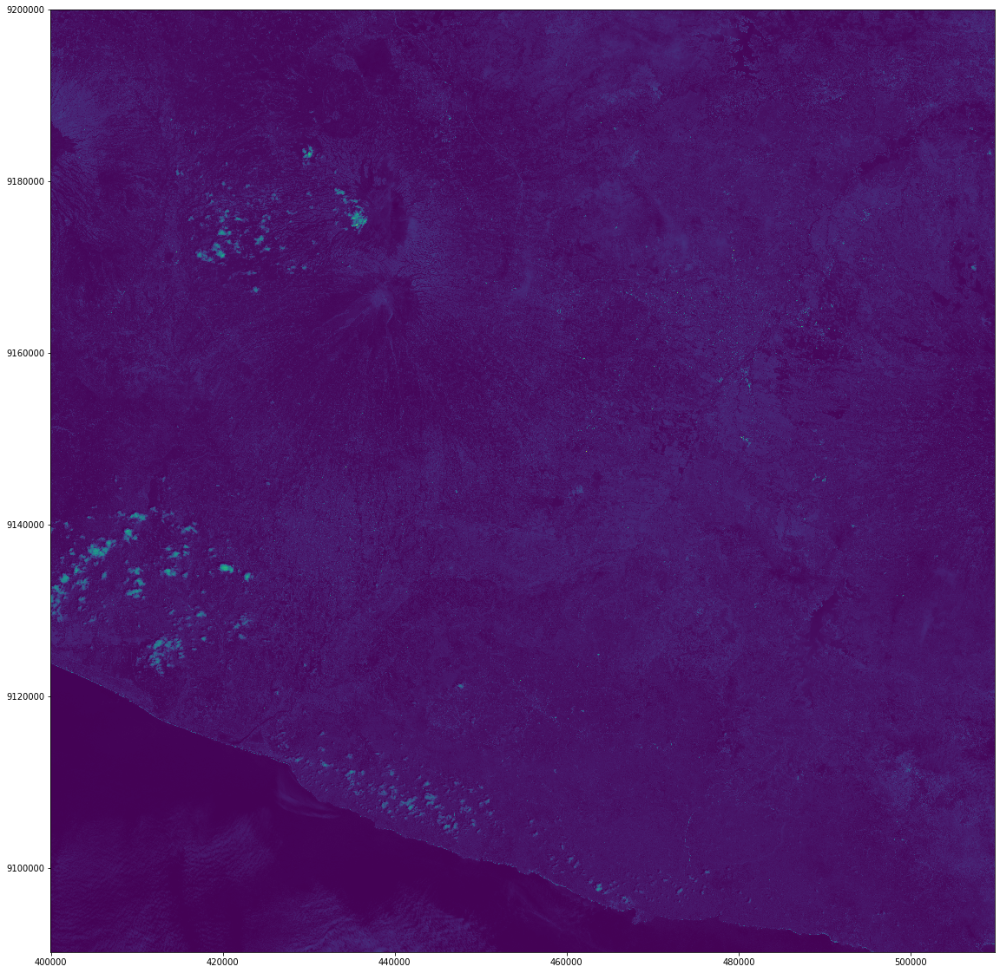

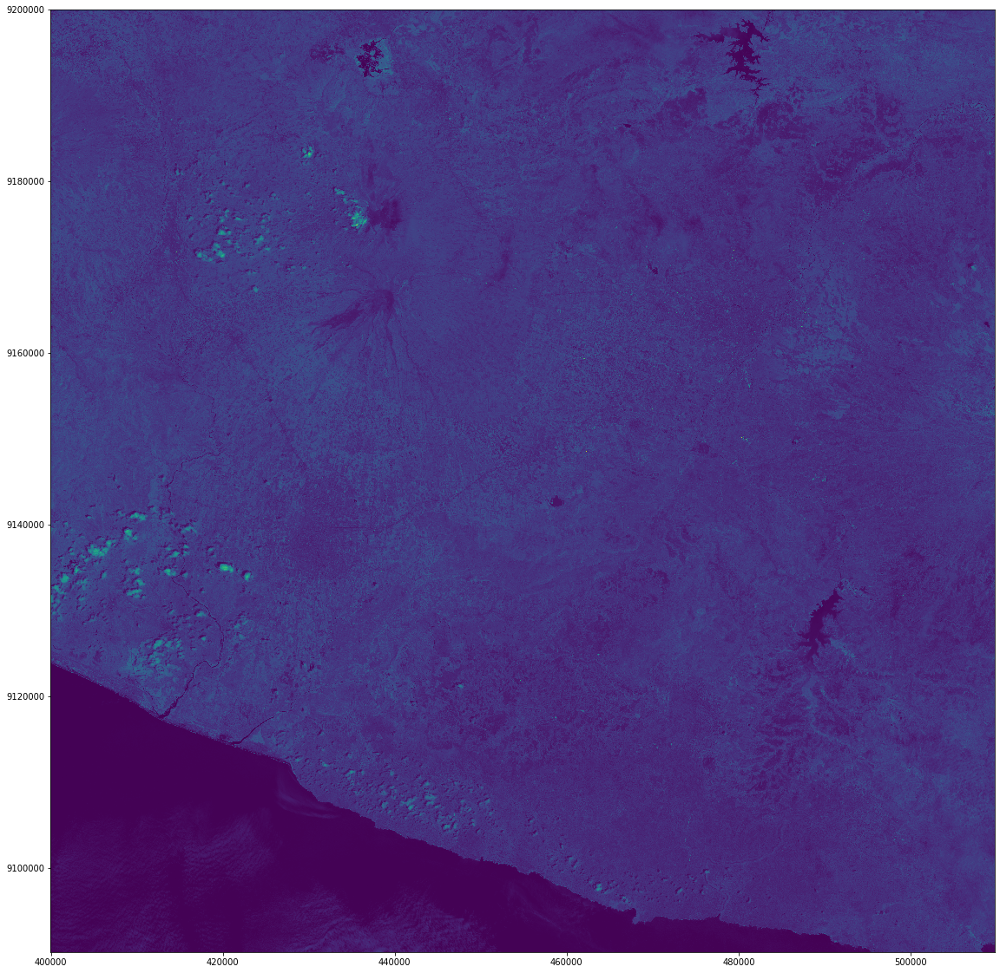

In [3]:
band_red = rasterio.open('D:/Geospatial/Sentinel/2019_15Nov/S2A_MSIL2A_20191115T023951_N0213_R089_T49MDM_20191115T063716.SAFE/GRANULE/L2A_T49MDM_A022966_20191115T025622/IMG_DATA/R10m/T49MDM_20191115T023951_B04_10m.jp2')
band_nir = rasterio.open('D:/Geospatial/Sentinel/2019_15Nov/S2A_MSIL2A_20191115T023951_N0213_R089_T49MDM_20191115T063716.SAFE/GRANULE/L2A_T49MDM_A022966_20191115T025622/IMG_DATA/R10m/T49MDM_20191115T023951_B08_10m.jp2')

fig, ax = plt.subplots(1, figsize=(20, 20))
show(band_red, ax=ax)
plt.show()

fig, ax = plt.subplots(1, figsize=(20, 20))
show(band_nir, ax=ax)
plt.show()

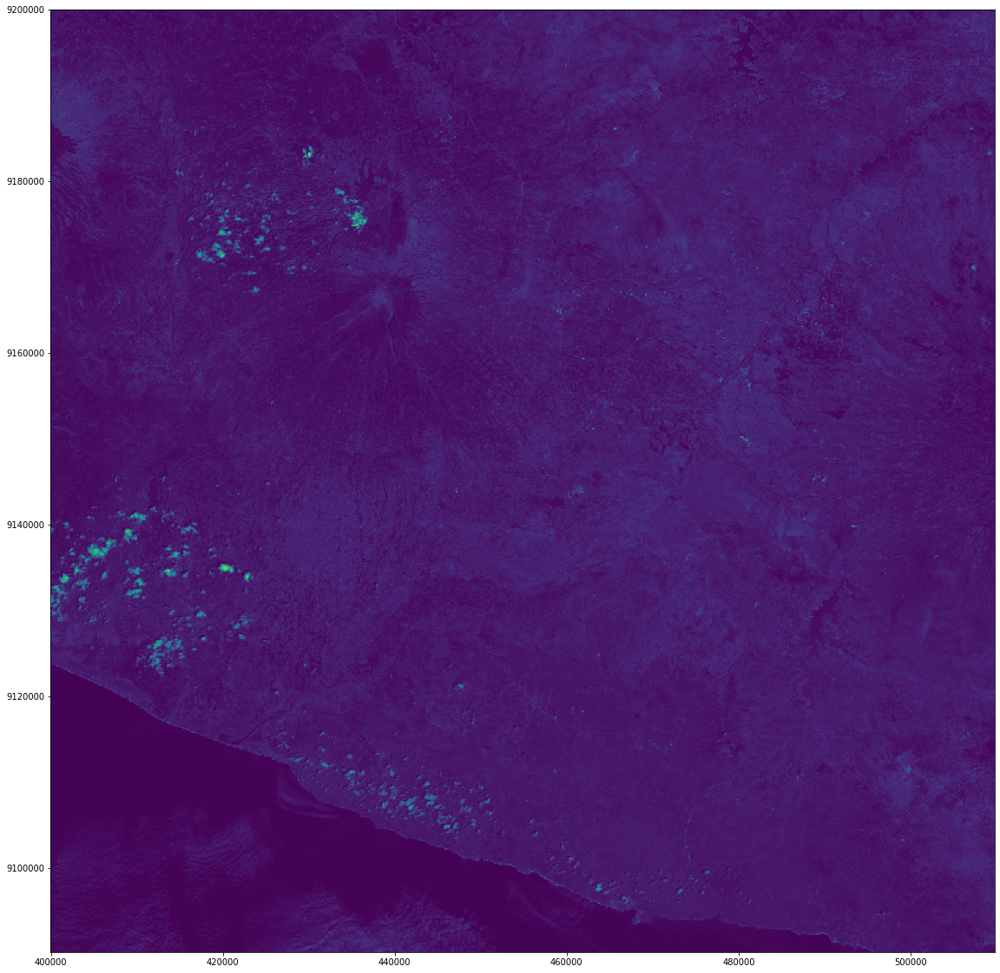

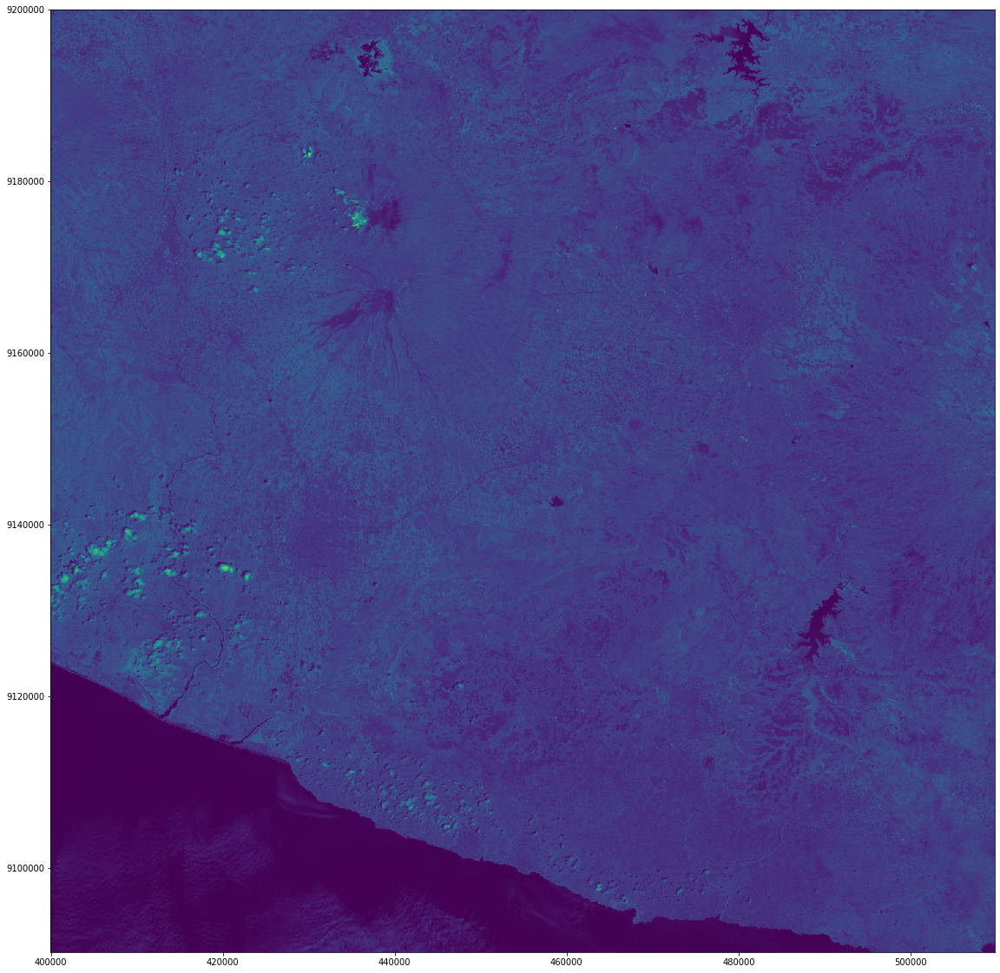

In [4]:
band_red = rasterio.open('D:/Geospatial/Sentinel/2019_15Nov/S2A_MSIL2A_20191115T023951_N0213_R089_T49MDM_20191115T063716.SAFE/GRANULE/L2A_T49MDM_A022966_20191115T025622/IMG_DATA/R60m/T49MDM_20191115T023951_B04_60m.jp2')
band_nir = rasterio.open('D:/Geospatial/Sentinel/2019_15Nov/S2A_MSIL2A_20191115T023951_N0213_R089_T49MDM_20191115T063716.SAFE/GRANULE/L2A_T49MDM_A022966_20191115T025622/IMG_DATA/R60m/T49MDM_20191115T023951_B8A_60m.jp2')

fig, ax = plt.subplots(1, figsize=(20, 20))
show(band_red, ax=ax)
plt.show()

fig, ax = plt.subplots(1, figsize=(20, 20))
show(band_nir, ax=ax)
plt.show()

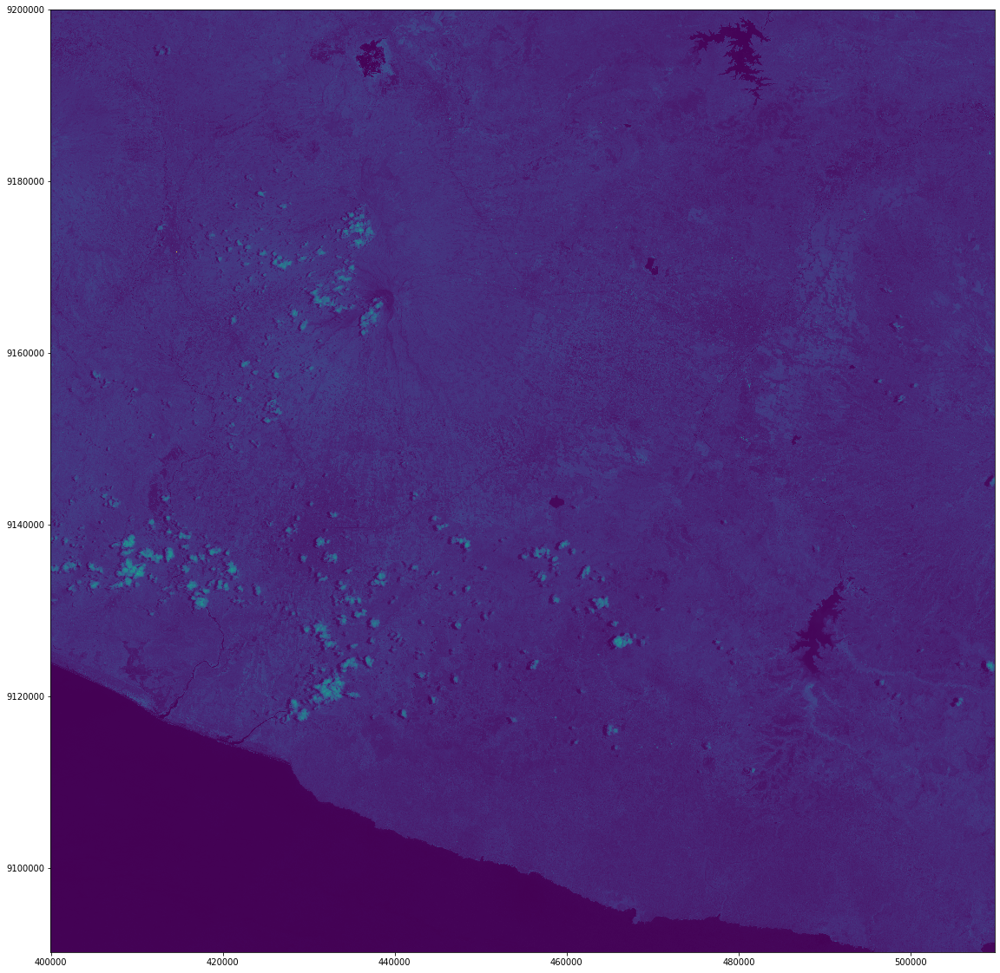

In [4]:
fig, ax = plt.subplots(1, figsize=(20, 20))
show(band_nir, ax=ax)
plt.show()

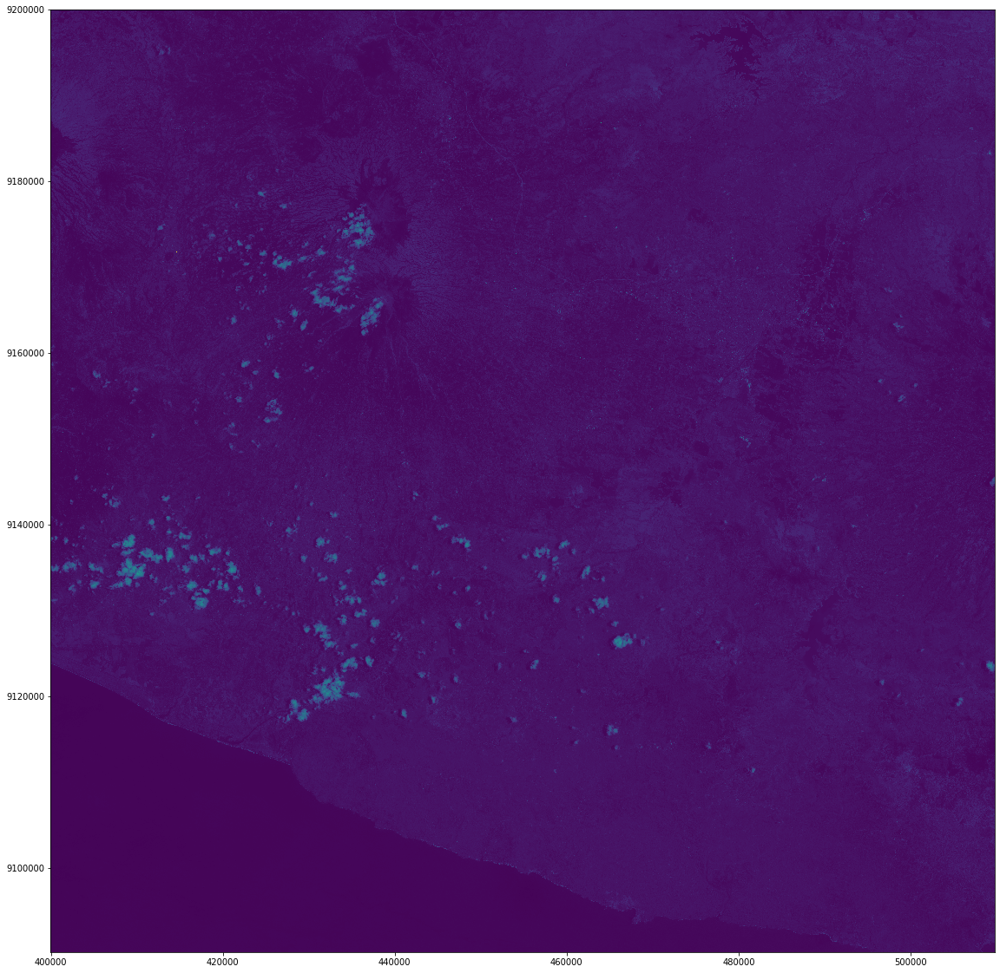

In [5]:
fig, ax = plt.subplots(1, figsize=(20, 20))
show(band_red, ax=ax)
plt.show()

In [ ]:
# Do not display error when divided by zero 
numpy.seterr(divide='ignore', invalid='ignore')

nir = band_nir.read()
red = band_red.read()

# NDVI 
ndvi = (nir.astype(float) - red.astype(float)) / (nir + red)

In [5]:
ndvi

array([[[ 0.00697999,  0.00789596,  0.01102941, ...,  0.43201543,
          0.49043193,  0.56499356],
        [ 0.00462773,  0.01249491,  0.01295382, ...,  0.50846468,
          0.53111251,  0.61281337],
        [ 0.0060437 ,  0.00830671,  0.01021301, ...,  0.5898767 ,
          0.6166547 ,  0.61939219],
        ...,
        [-0.35036496, -0.22142857, -0.10548523, ...,         nan,
                 nan,         nan],
        [-0.23206751, -0.17266187, -0.20912548, ...,         nan,
                 nan,         nan],
        [-0.1440678 , -0.12852665, -0.1369509 , ...,         nan,
                 nan,         nan]]])

In [10]:
print(numpy.nanmin(ndvi)) 
print(numpy.nanmax(ndvi))

-0.9978189749182116
0.9984813971146546


In [9]:
# get the dtype of NDVI array:
ndvi_dtype = ndvi.dtype
print(ndvi_dtype)

float64


In [10]:
# get the metadata of original GeoTIFF:
meta = band_red.meta
print(meta)

{'driver': 'JP2OpenJPEG', 'dtype': 'uint16', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 1, 'crs': CRS.from_epsg(32749), 'transform': Affine(10.0, 0.0, 300000.0,
       0.0, -10.0, 9100000.0)}


In [22]:
ndvi.shape

(1, 10980, 10980)

In [11]:
ndvi1 = numpy.squeeze(ndvi, axis = 0)

In [14]:
ndvi1.shape

(10980, 10980)

In [16]:
numpy.savetxt("D:/CSV/jan7.csv", ndvi1, delimiter=",")

In [20]:
meta = band_red.meta

meta.update(driver='GTiff')
meta.update(dtype=rasterio.float32)

with rasterio.open('NDVI.tif', 'w', **meta) as dst:
    dst.write(ndvi.astype(rasterio.float32))

In [21]:
from matplotlib import colors


class MidpointNormalize(colors.Normalize):
   
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
       
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return numpy.ma.masked_array(numpy.interp(value, x, y), numpy.isnan(value))

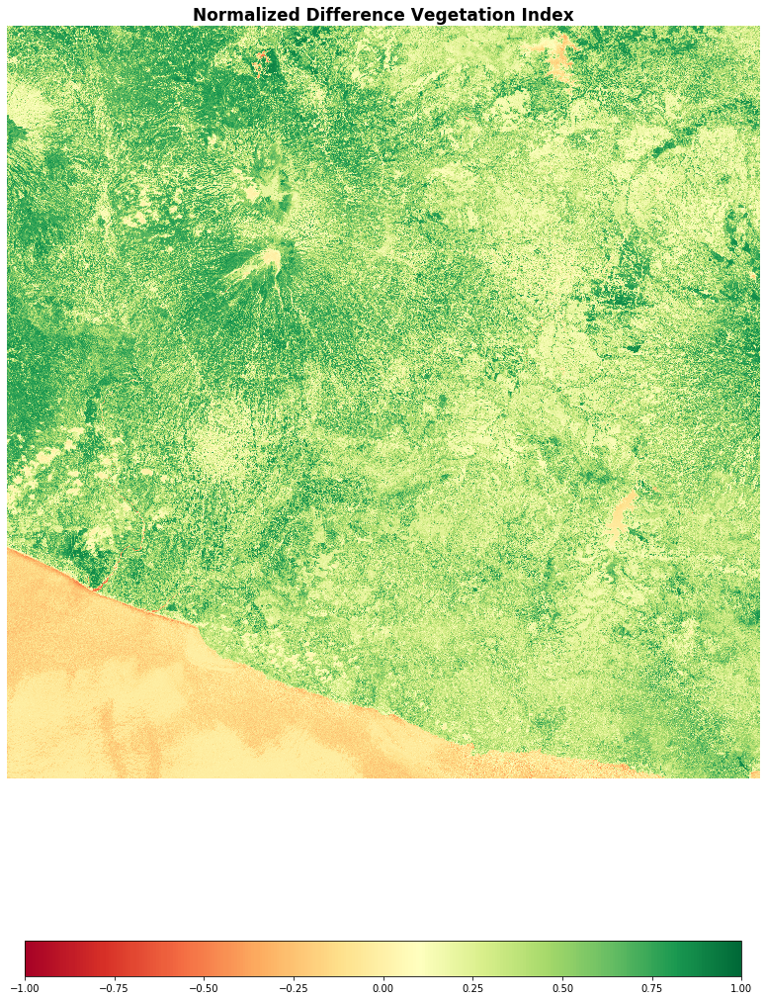

In [24]:
min=numpy.nanmin(ndvi1)
max=numpy.nanmax(ndvi1)

# Set our custom midpoint for most effective NDVI analysis
mid=0.1

# Setting color scheme ref:https://matplotlib.org/users/colormaps.html as a reference
colormap = plt.cm.RdYlGn 
norm = MidpointNormalize(vmin=min, vmax=max, midpoint=mid)
fig = plt.figure(figsize=(20,20))


ax = fig.add_subplot(111)

# Use 'imshow' to specify the input data, colormap, min, max, and norm for the colorbar
cbar_plot = ax.imshow(ndvi1, cmap=colormap, vmin=min, vmax=max, norm=norm)


# Turn off the display of axis labels 
ax.axis('off')

# Set a title 
ax.set_title('Normalized Difference Vegetation Index', fontsize=17, fontweight='bold')

# Configure the colorbar
cbar = fig.colorbar(cbar_plot, orientation='horizontal', shrink=0.65)

# Call 'savefig' to save this plot to an image file
/fig.savefig("ndvi-image.png", dpi=200, bbox_inches='tight', pad_inches=0.7)

# let's visualize
plt.show()